In [1]:
import torch
import torch.nn as nn
from PIL import Image
import os
from IPython.display import display
import numpy as np
import torch.optim as optim
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from skimage.metrics import structural_similarity as ssim
import random
from torch.utils.data import random_split
import matplotlib.pyplot as plt

In [2]:
class UNet_Denoise(nn.Module):

    def __init__(self):
        super(UNet_Denoise, self).__init__()

        # Convolution level 1
        self.conv1_1 = nn.Conv2d(1, 64, kernel_size=3, padding=1)
        self.conv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        # C2
        self.conv2_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv2_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        # C3
        self.conv3_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv3_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # C4
        self.conv4_1 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv4_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck
        self.conv5_1 = nn.Conv2d(512, 1024, kernel_size=3, padding=1)
        self.conv5_2 = nn.Conv2d(1024, 1024, kernel_size=3, padding=1)

        # Transposed convolution level 5
        self.transpose4 = nn.ConvTranspose2d(1024, 512, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.upconv4_2 = nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        self.upconv4_1 = nn.Conv2d(512, 512, kernel_size=3, padding=1)

        # T3
        self.transpose3 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.upconv3_2 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.upconv3_1 = nn.Conv2d(256, 256, kernel_size=3, padding=1)

        # T2
        self.transpose2 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.upconv2_2 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.Tconv2_1 = nn.Conv2d(128, 128, kernel_size=3, padding=1)

        # T1
        self.transpose1 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.upconv1_3 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.upconv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.upconv1_1 = nn.Conv2d(64, 1, kernel_size=3, padding=1)

        # Skip connections
        self.skip_connection1 = nn.Conv2d(64, 64, kernel_size=1)
        self.skip_connection2 = nn.Conv2d(128, 128, kernel_size=1)
        self.skip_connection3 = nn.Conv2d(256, 256, kernel_size=1)
        self.skip_connection4 = nn.Conv2d(512, 512, kernel_size=1)

    def forward(self, x):
        s1_1 = self.conv1_1(x)
        rel1 = F.relu(s1_1)
        s1_2 = self.conv1_2(rel1)
        rel2 = F.relu(s1_2)
        pooled1 = self.pool1(rel2)

        s2_1 = self.conv2_1(pooled1)
        rel3 = F.relu(s2_1)
        s2_2 = self.conv2_2(rel3)
        rel4 = F.relu(s2_2)
        pooled2 = self.pool2(rel4)

        s3_1 = self.conv3_1(pooled2)
        rel5 = F.relu(s3_1)
        s3_2 = self.conv3_2(rel5)
        rel6 = F.relu(s3_2)
        pooled3 = self.pool3(rel6)

        s4_1 = self.conv4_1(pooled3)
        rel7 = F.relu(s4_1)
        s4_2 = self.conv4_2(rel7)
        rel8 = F.relu(s4_2)
        pooled4 = self.pool4(rel8)

        # bottleneck
        s5_1 = self.conv5_1(pooled4)
        rel9 = F.relu(s5_1)
        s5_2 = self.conv5_2(rel9)
        rel10 = F.relu(s5_2)

        # after bottleneck
        up4 = self.transpose4(rel10)
        skip_con4 = self.skip_connection4(rel8)
        up4 = torch.cat([up4, skip_con4], dim=1)
        upconv4_2 = self.upconv4_2(up4)
        uprel4_2 = F.relu(upconv4_2)
        upconv4_1 = self.upconv4_1(uprel4_2)
        uprel4_1 = F.relu(upconv4_1)

        up3 = self.transpose3(uprel4_1)
        skip_con3 = self.skip_connection3(rel6)
        up3 = torch.cat([up3, skip_con3], dim=1)
        upconv3_2 = self.upconv3_2(up3)
        uprel3_2 = F.relu(upconv3_2)
        upconv3_1 = self.upconv3_1(uprel3_2)
        uprel3_1 = F.relu(upconv3_1)

        up2 = self.transpose2(uprel3_1)
        skip_con2 = self.skip_connection2(rel4)
        up2 = torch.cat([up2, skip_con2], dim=1)
        upconv2_2 = self.upconv2_2(up2)
        uprel2_2 = F.relu(upconv2_2)
        Tconv2_1 = self.Tconv2_1(uprel2_2)
        uprel2_1 = F.relu(Tconv2_1)

        up1 = self.transpose1(uprel2_1)
        skip_con1 = self.skip_connection1(rel2)
        up1 = torch.cat([up1, skip_con1], dim=1)
        upconv1_3 = self.upconv1_3(up1)
        uprel1_3 = F.relu(upconv1_3)
        upconv1_2 = self.upconv1_2(uprel1_3)
        uprel1_2 = F.relu(upconv1_2)
        upconv1_1 = self.upconv1_1(uprel1_2)
        output = F.relu(upconv1_1)
        return output
    
class DataSet(Dataset):
    def __init__(self, folder_path, transform=None):
        self.folder_path = folder_path
        self.transform = transform
        self.images = [os.path.join(folder_path, filename) for filename in os.listdir(folder_path)]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        image = Image.open(image_path).convert('L')  # Convert image to grayscale

        if self.transform:
            image = self.transform(image)

        return image
    
def PSNR(MAX, MSE):
    return 20*np.log10(MAX) - 10*np.log10(MSE)
    

In [3]:

if torch.cuda.is_available():
    device = torch.device("cuda")          # a CUDA device object
    print(f"Using CUDA device: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")
    print("CUDA is not available. Using CPU instead.")
    

training_images_folder = "Train400"
testing_images_folder = "test68"


transformer = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.ToTensor(),
])

training_dataset = DataSet(training_images_folder,transform = transformer)



print("First tensor after transform:")
print(training_dataset[0])
print("First tensor shape: ")
print(training_dataset[0].shape)
min_value = training_dataset[0].min()
max_value = training_dataset[0].max()
print(f'Min Pixel: {min_value}, Max Pixel: {max_value}')



Using CUDA device: NVIDIA GeForce RTX 4060 Ti
First tensor after transform:
tensor([[[0.2510, 0.2588, 0.2667,  ..., 0.3373, 0.3490, 0.3569],
         [0.2745, 0.2824, 0.2863,  ..., 0.3294, 0.3373, 0.3451],
         [0.3020, 0.3020, 0.3020,  ..., 0.3137, 0.3137, 0.3176],
         ...,
         [0.2157, 0.2157, 0.2275,  ..., 0.4863, 0.4314, 0.3804],
         [0.2078, 0.2000, 0.2078,  ..., 0.4627, 0.4039, 0.3451],
         [0.2000, 0.1882, 0.1843,  ..., 0.4431, 0.3922, 0.3373]]])
First tensor shape: 
torch.Size([1, 256, 256])
Min Pixel: 0.09803921729326248, Max Pixel: 0.8745098114013672


In [4]:

#trainSize = 360, validationSize = 40, testSize = 68

testD = DataSet(testing_images_folder, transform = transformer)
trainD, valD = random_split(training_dataset, [int(0.9*len(training_dataset)), int(0.1*len(training_dataset))])
train_load = DataLoader(trainD, batch_size=35,shuffle=True)
test_load = DataLoader(testD, batch_size=35,shuffle=True)
val_load = DataLoader(valD, batch_size=35,shuffle=True)


In [5]:
#finished pre processing


In [6]:

#for training, we have these variables set up ahead of itme
model = UNet_Denoise().to(device)

dataset_size = 400
learning_rate = 0.001
loss_fn = nn.MSELoss()  # Mean Squared Error loss
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  # Adam optimizer
epochs = 1
mean = 0
variance = 15/255

#lists for graphing later

#each value in these lists is for a single batch
training_loss = []
validation_loss = []
ssim_on = []#we are going to compare ORIGINAL vs NOISY which is going to be bad
ssim_oo = []# versus, ORIGINAL vs OUTPUT, which should be a lot more simikar
psnr_on = []
psnr_oo = []

In [ ]:
for ep in range(epochs):
    model.train()
    
    # taken to average the n batches in a epoch
    VLoss = 0
    vC=0
    ssimon = 0
    ssimoo = 0
    psnron = 0
    psnroo = 0
    spC=0
    
    for batch_idx, images in enumerate(train_load):
        clean_images = images.to(device)
        model_input = clean_images + (torch.randn_like(clean_images) * variance + mean)
        
        optimizer.zero_grad()
        outputs = model(model_input)
        loss = loss_fn(outputs, clean_images)
        loss.backward()
        optimizer.step()
        
        # Validation steps
        model.eval()
        with torch.no_grad():
            for batch_idx, images in enumerate(val_load):
                clean_images = images.to(device)
                model_input = clean_images + (torch.randn_like(clean_images) * variance + mean)
                outputs = model(model_input)
                val_loss = loss_fn(outputs, clean_images)
                VLoss+=val_loss.item()
                vC+=1
                
                for original,noisy,output in zip(clean_images,model_input,outputs): 
                #variables in the validation set
                    original = original.detach().squeeze().cpu.numpy()
                    noisy = model_input.detach().squeeze().cpu.numpy()
                    output = outputs.detach().cpu.numpy()
                    
                    #SSIM
                    ssimon+=ssim(original,noisy)
                    ssimoo+=ssim(original,output)
                    
                    #PSNR
                    mseon=mse(original,noisy)
                    mseoo=mse(original,output)
                    
                    psnron+=PSNR(mseon,original.max())
                    psnroo+=PSNR(mseoo,original.max())
                    spC+=1
                    
        print(f"Epoch {ep+1}/{epochs}, Training Loss: {loss.item():.4f}, Validation \
        Loss: {VLoss/vC:.4f}, Avg SSIM of noisy images: {ssimon/spC:.4f}, Avg SSIM of\
        output images: {ssimoo/spC:.4f}, Avg PSNR of noisy images: {psnron/spC:.4f}, Avg\
        PSNR of output images: {psnroo/spC:.4f}")



KeyboardInterrupt: 

Batch 1, Test Loss: 0.2790463864803314


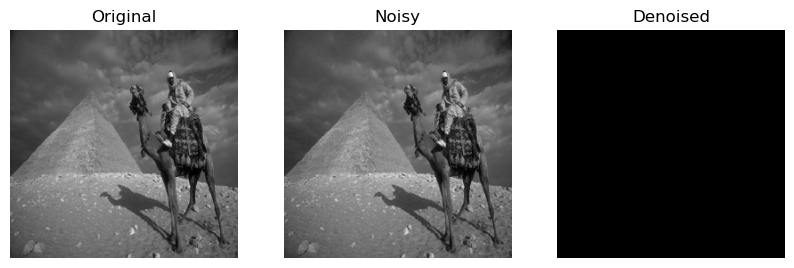

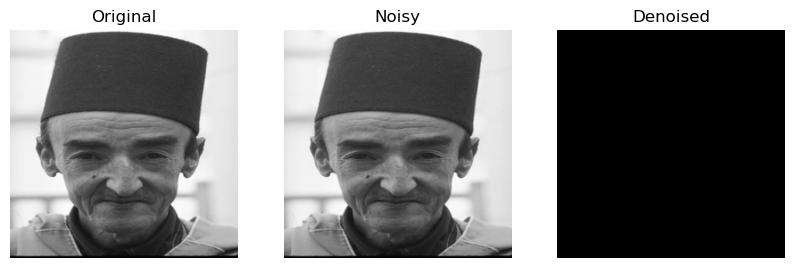

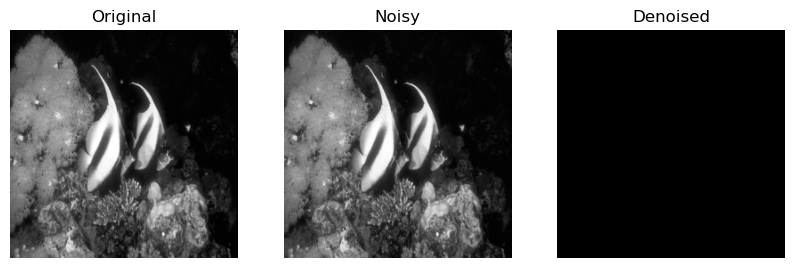

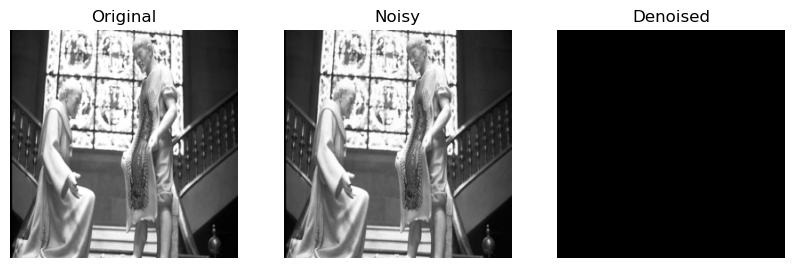

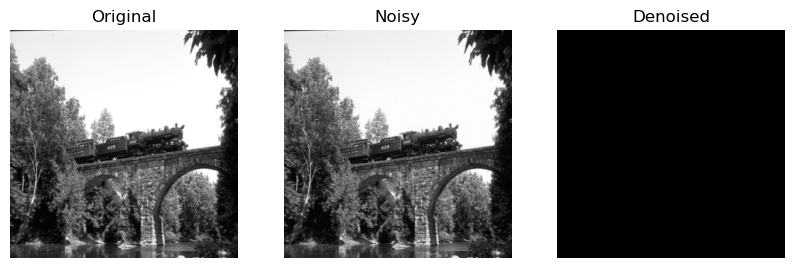

Batch 2, Test Loss: 0.18951399624347687


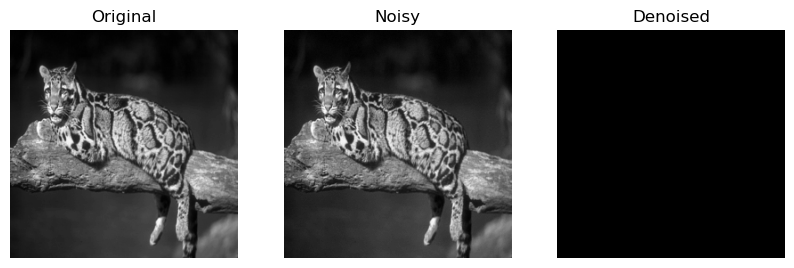

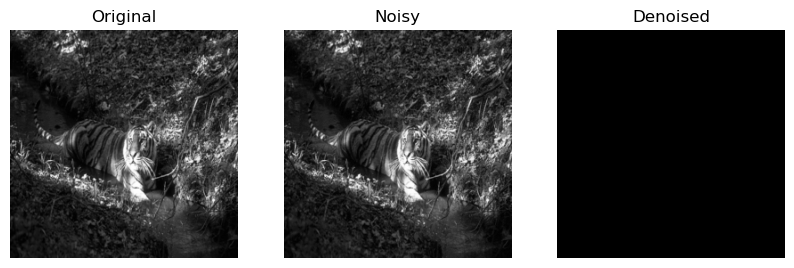

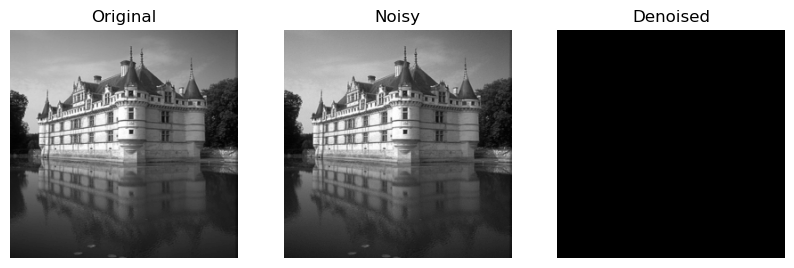

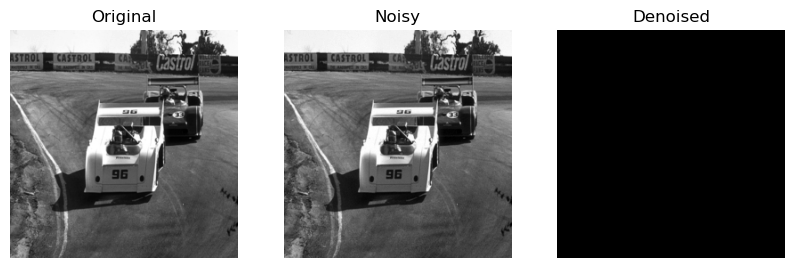

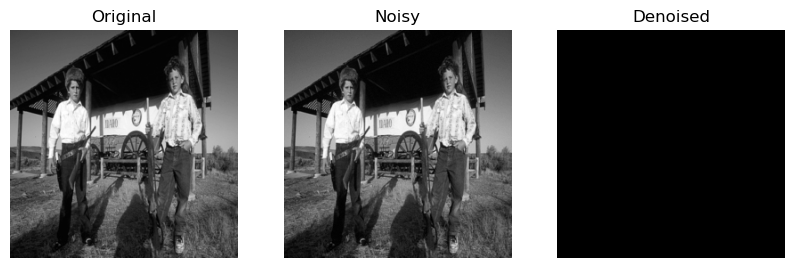

Batch 3, Test Loss: 0.2438521683216095


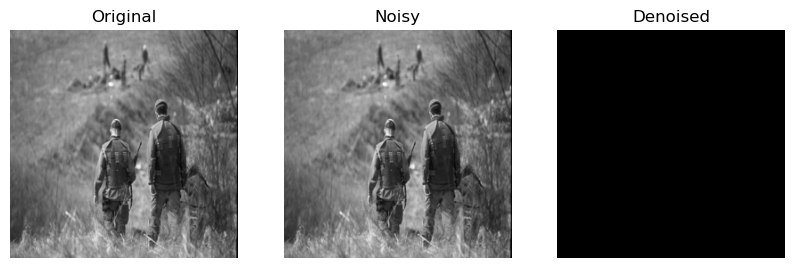

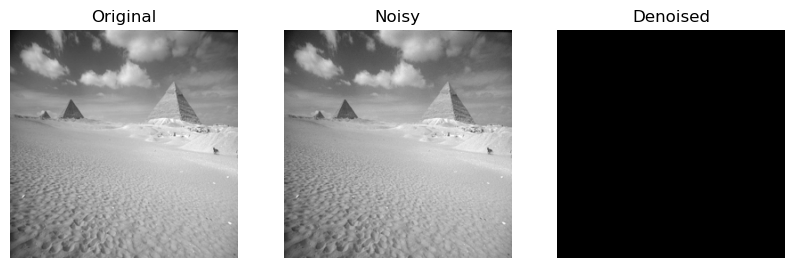

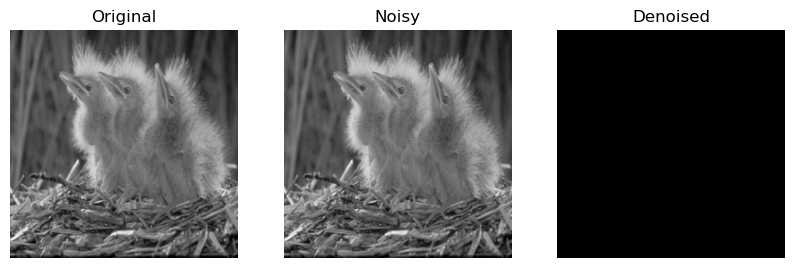

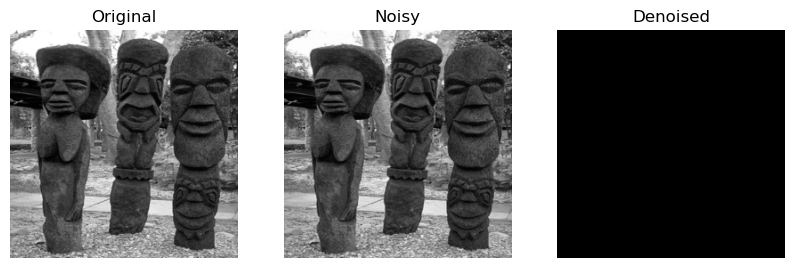

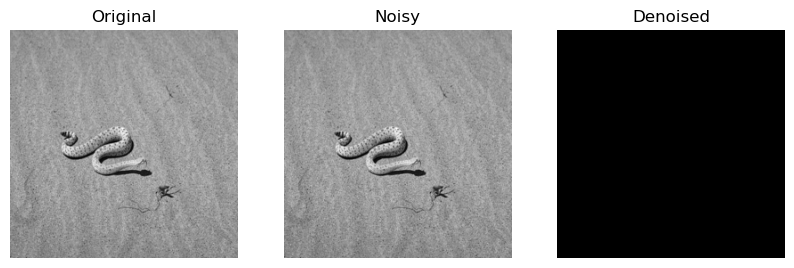

Batch 4, Test Loss: 0.2642090618610382


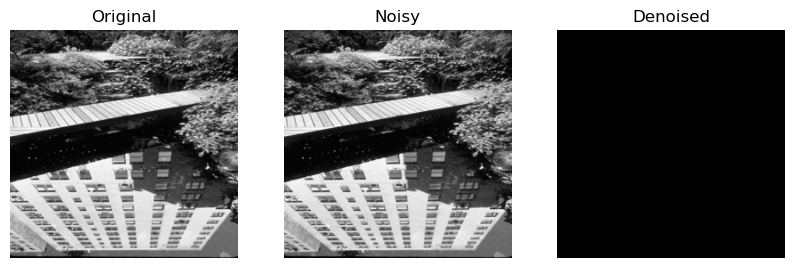

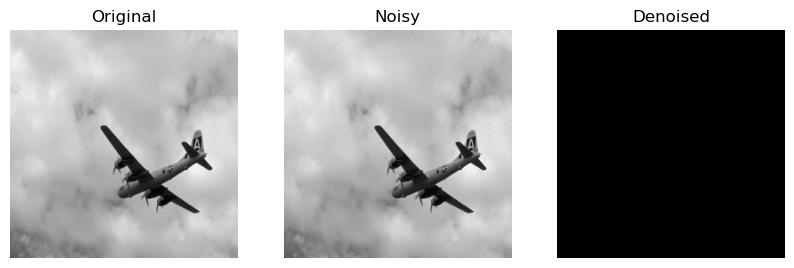

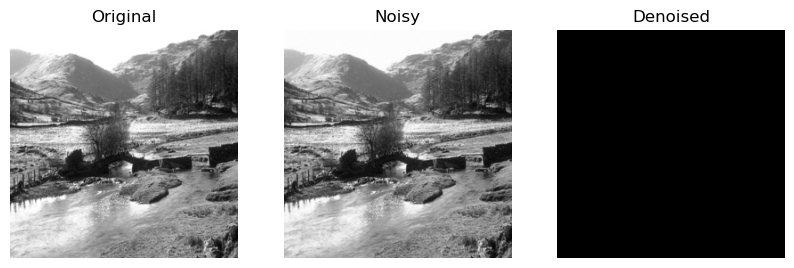

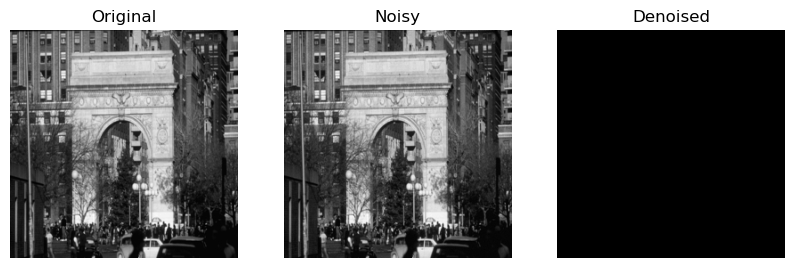

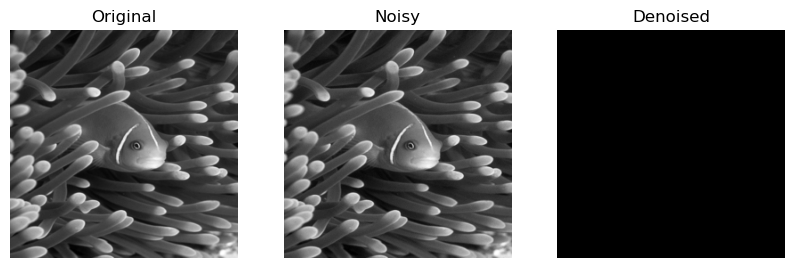

Batch 5, Test Loss: 0.2902553975582123


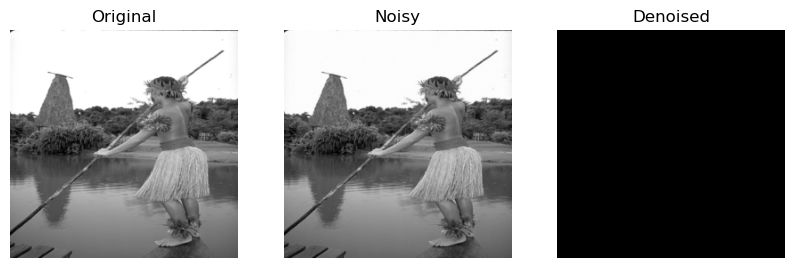

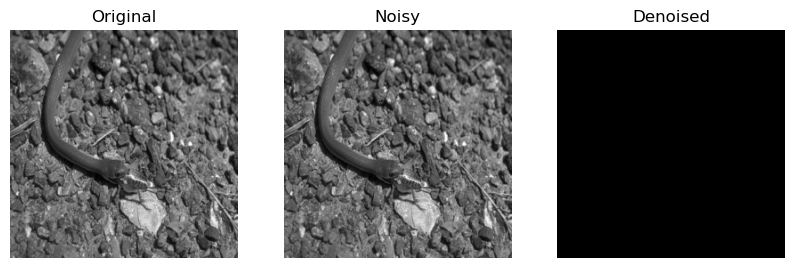

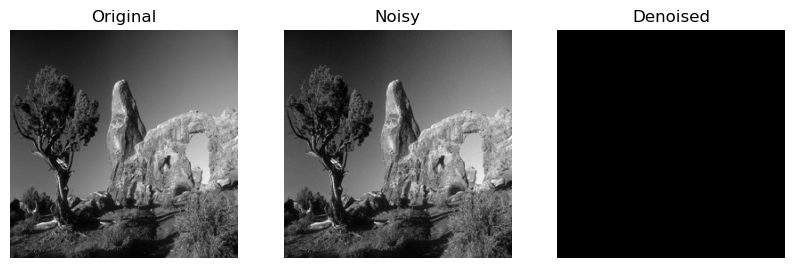

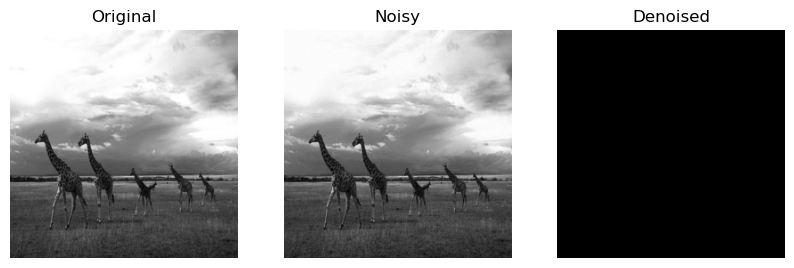

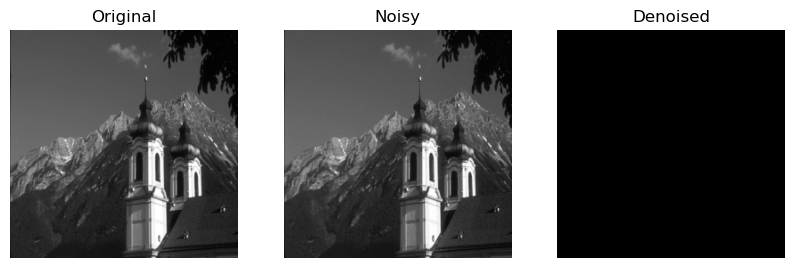

Batch 6, Test Loss: 0.16358768939971924


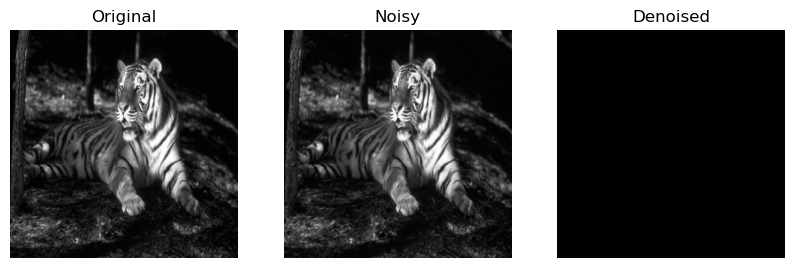

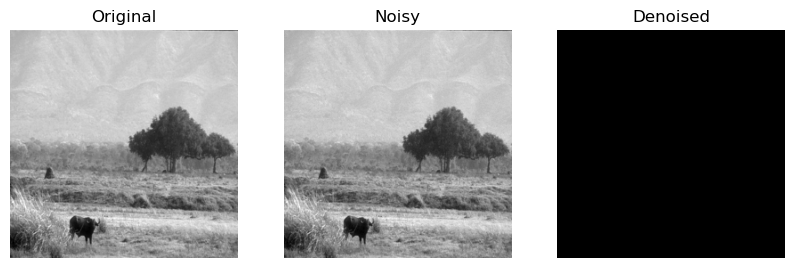

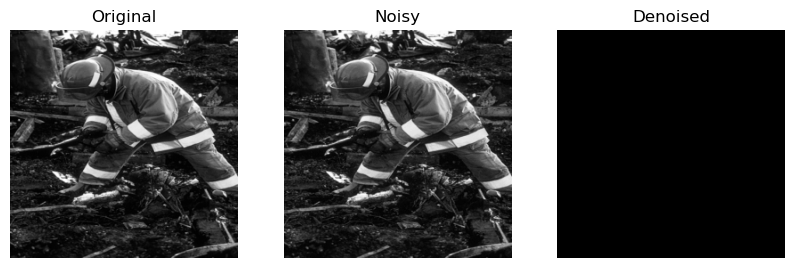

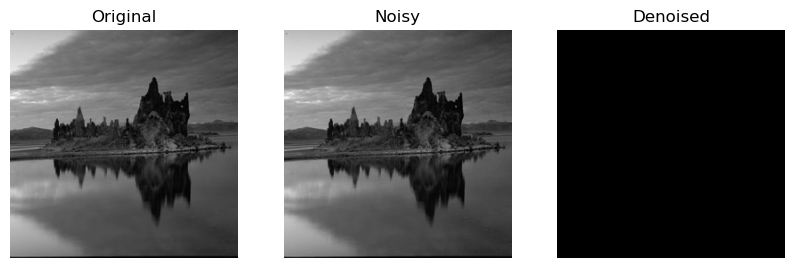

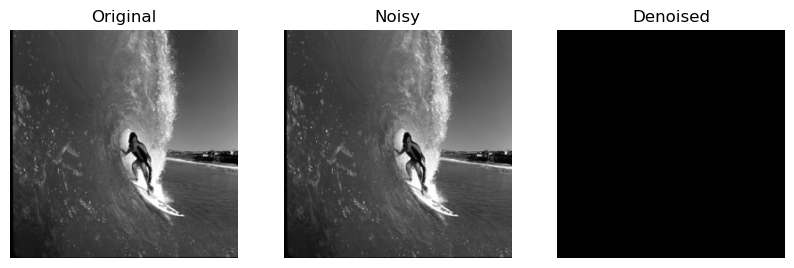

Batch 7, Test Loss: 0.3116334080696106


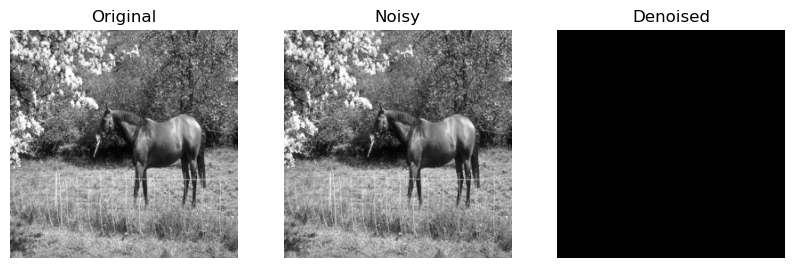

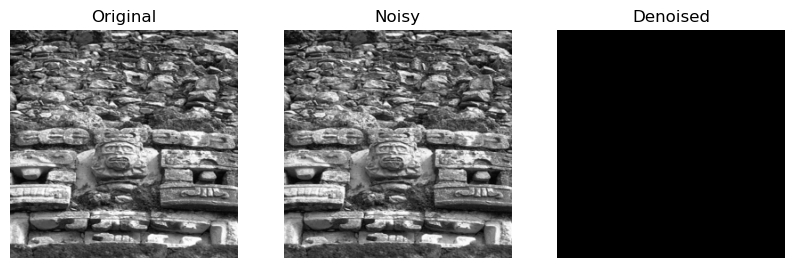

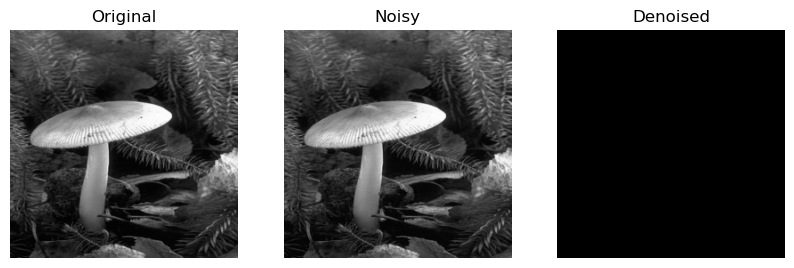

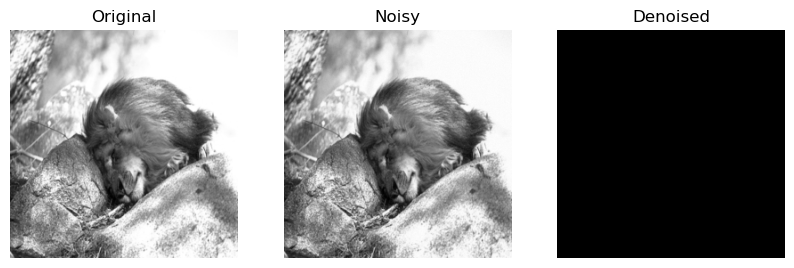

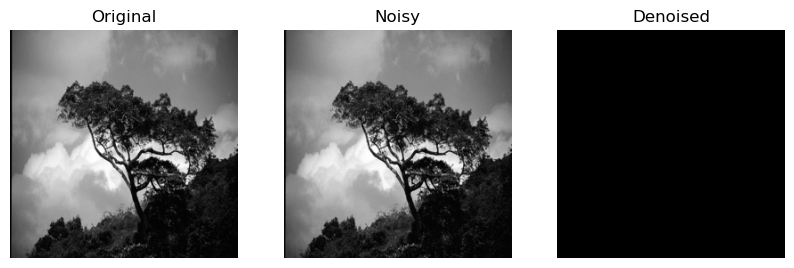

Batch 8, Test Loss: 0.22822518646717072


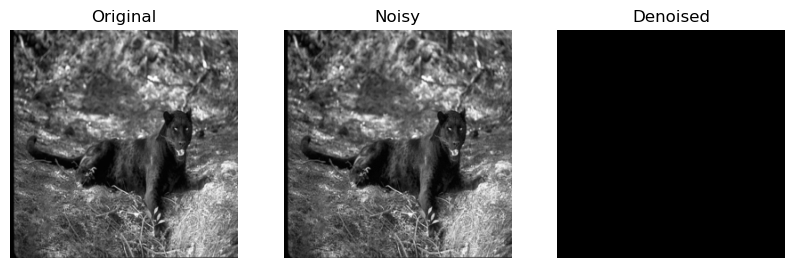

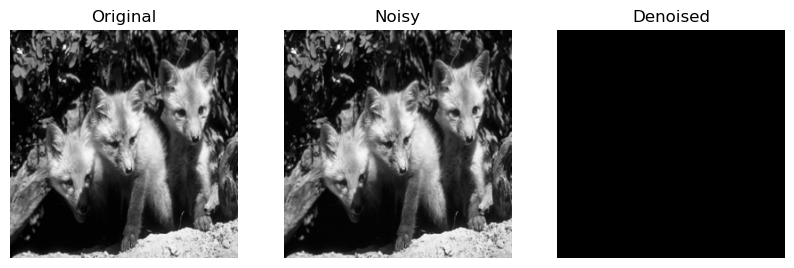

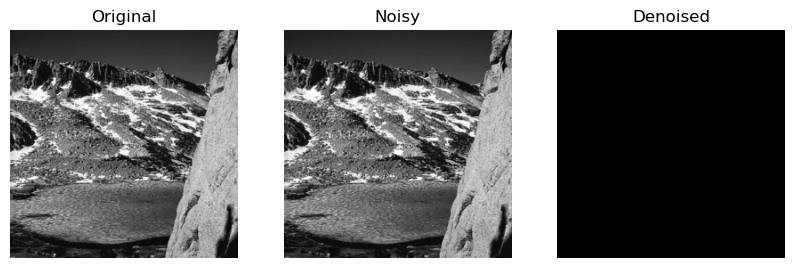

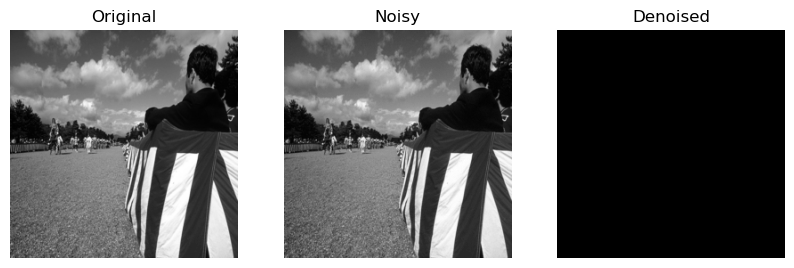

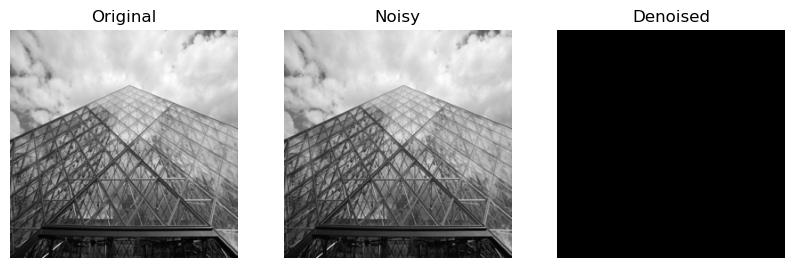

Batch 9, Test Loss: 0.3078235387802124


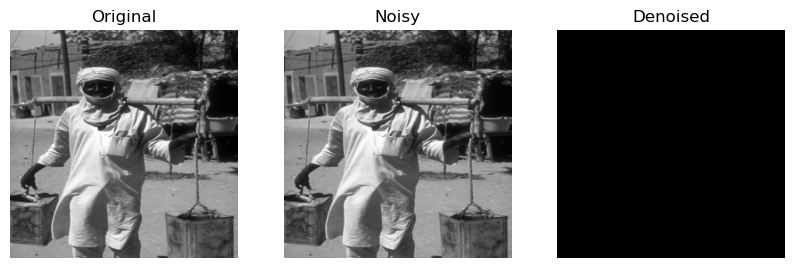

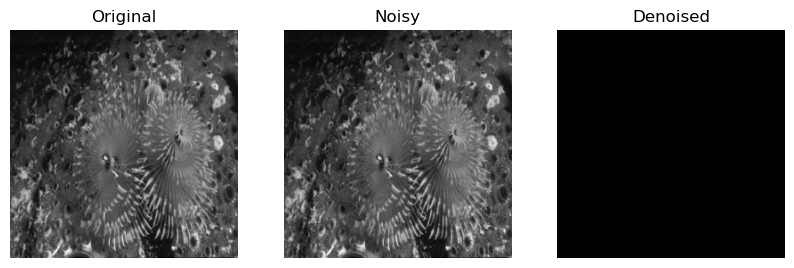

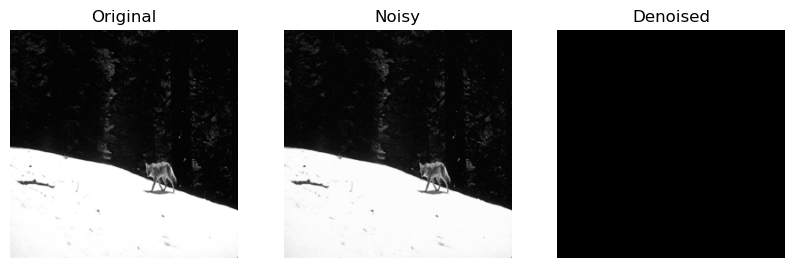

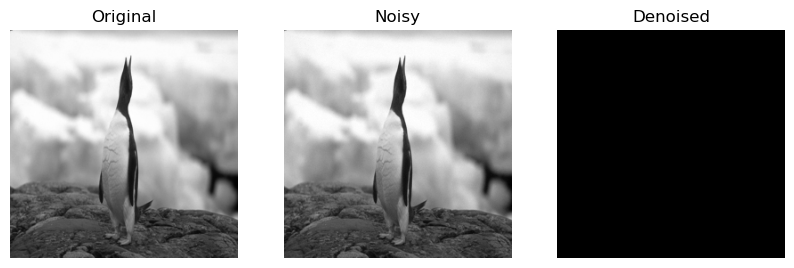

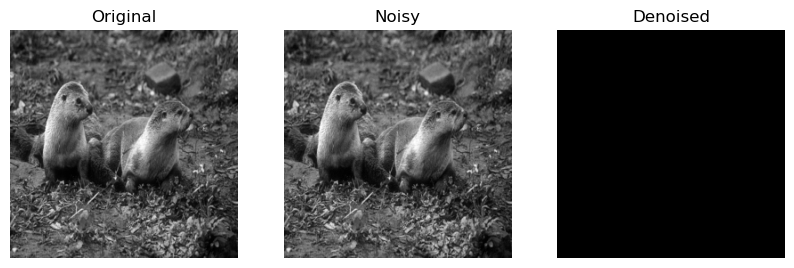

Batch 10, Test Loss: 0.19527950882911682


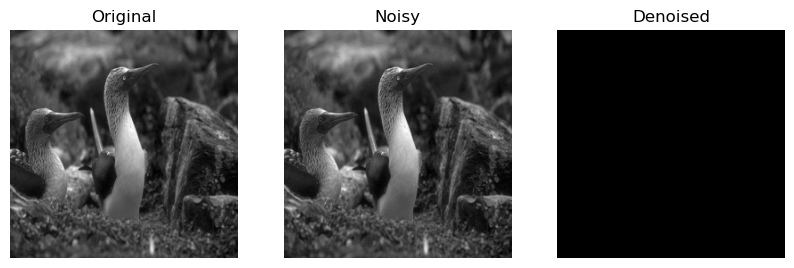

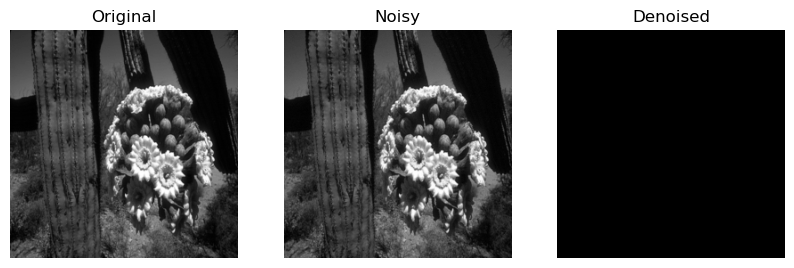

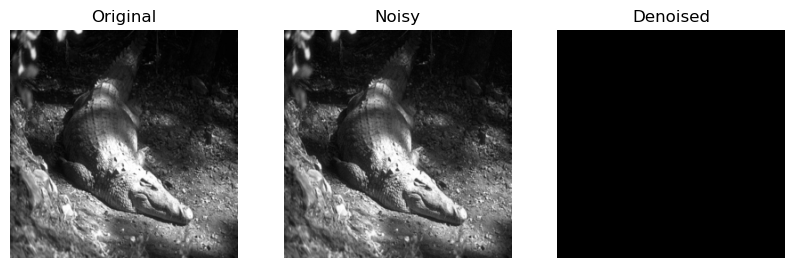

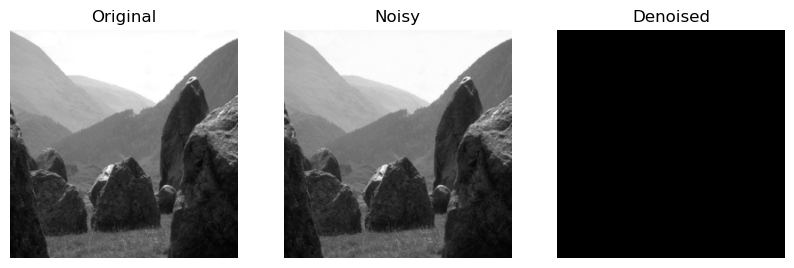

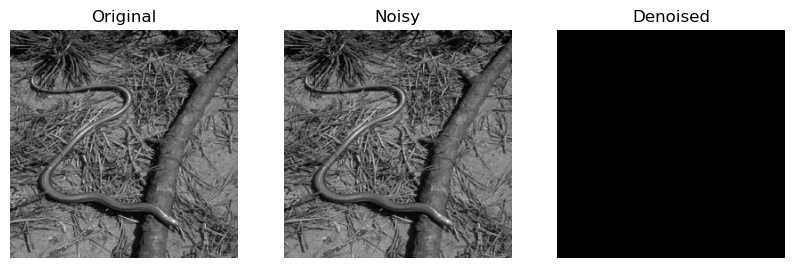

Batch 11, Test Loss: 0.20829367637634277


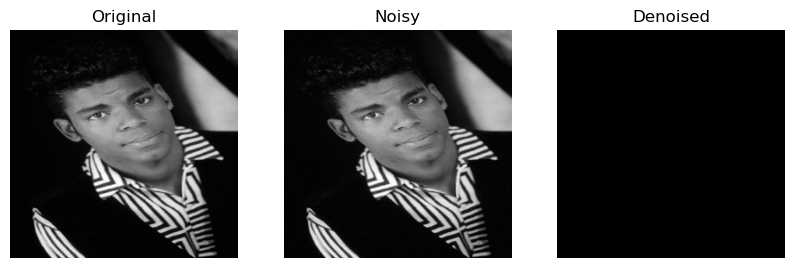

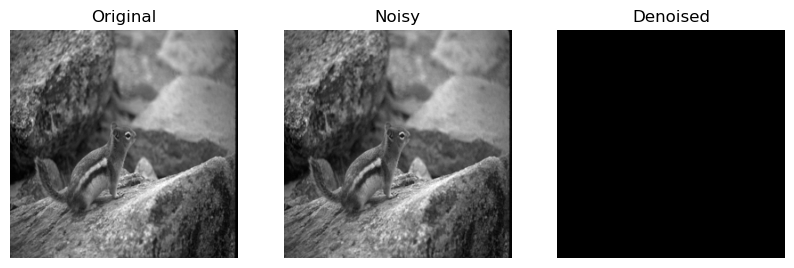

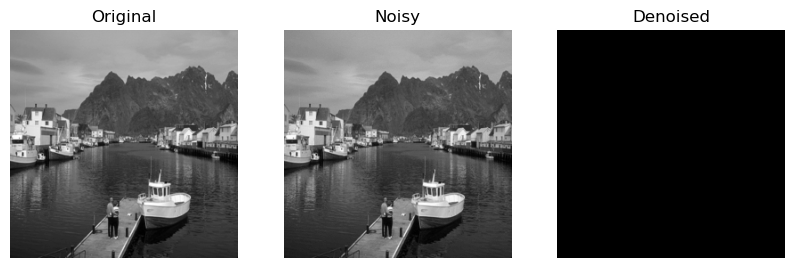

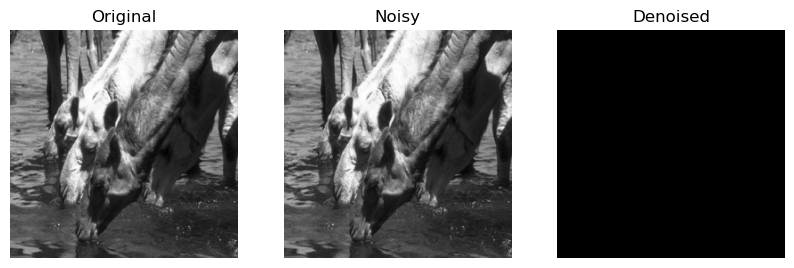

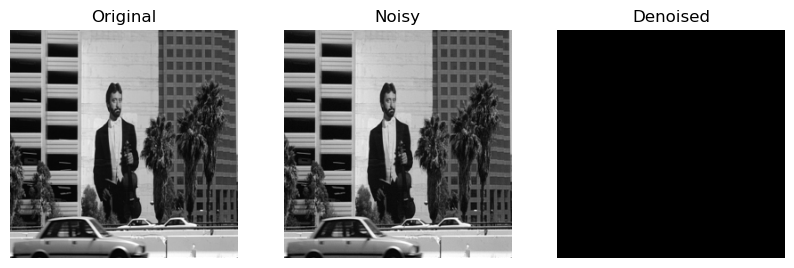

Batch 12, Test Loss: 0.174123153090477


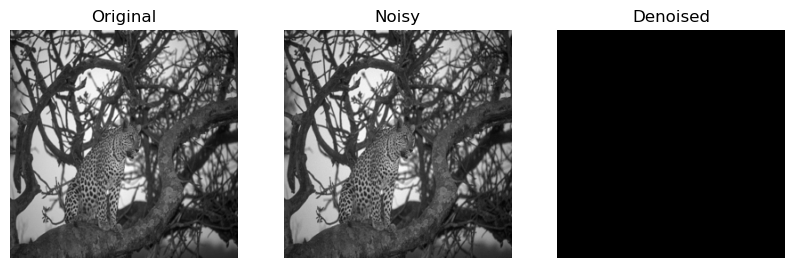

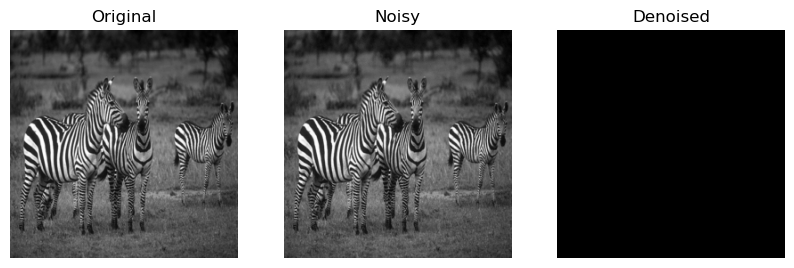

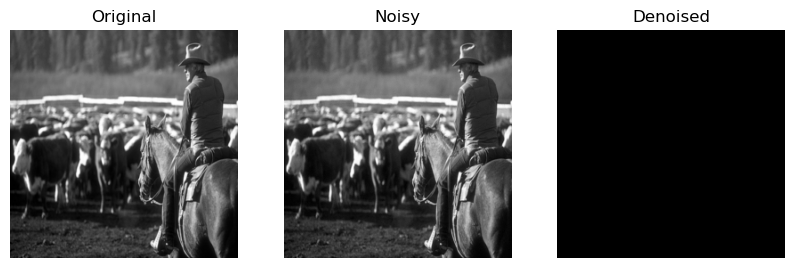

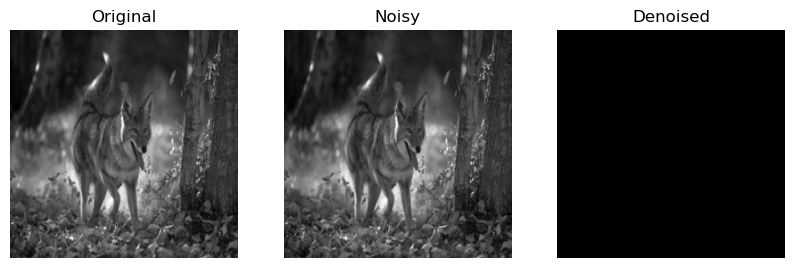

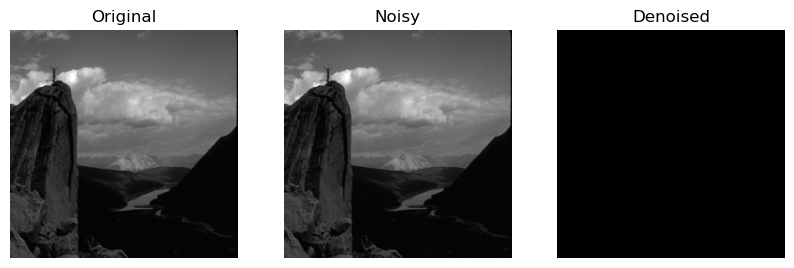

Batch 13, Test Loss: 0.27086707949638367


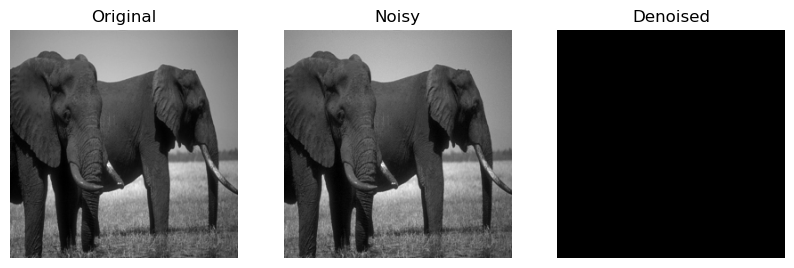

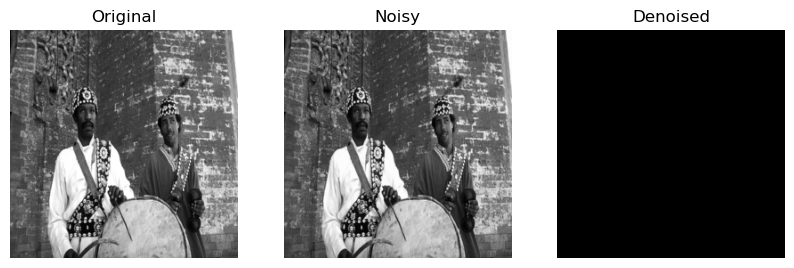

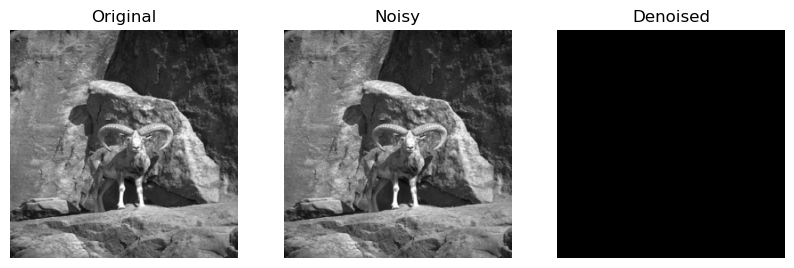

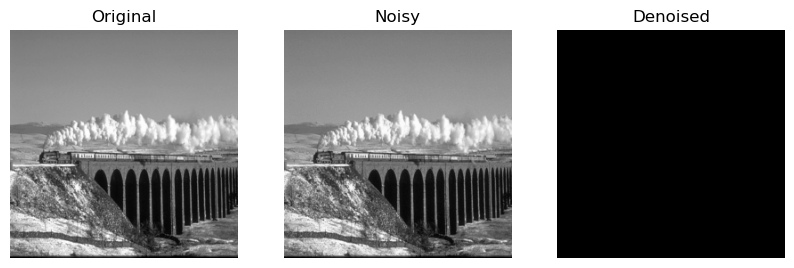

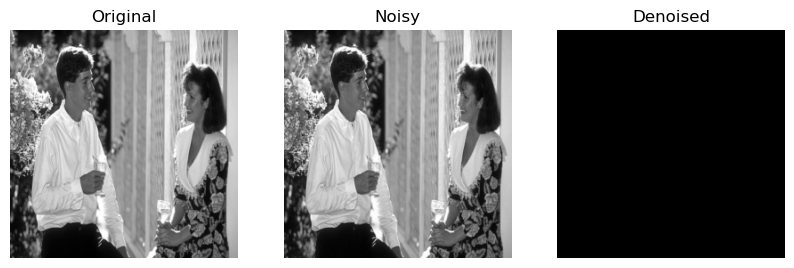

Batch 14, Test Loss: 0.2108146846294403


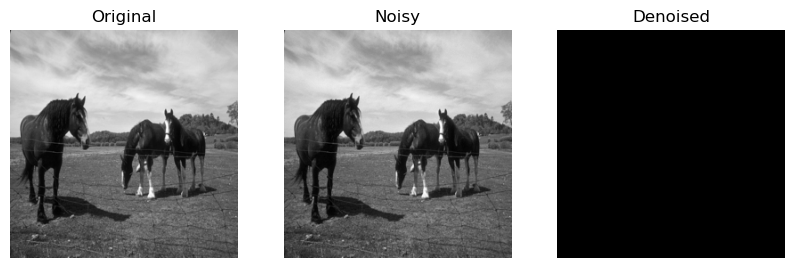

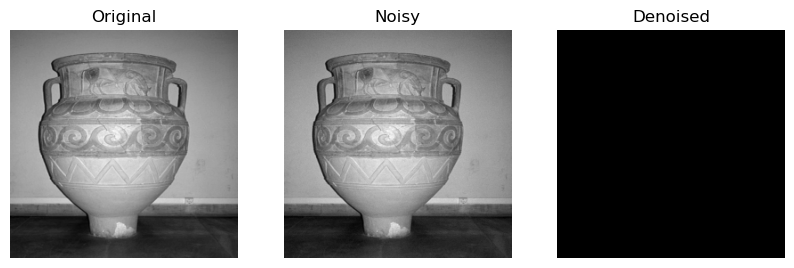

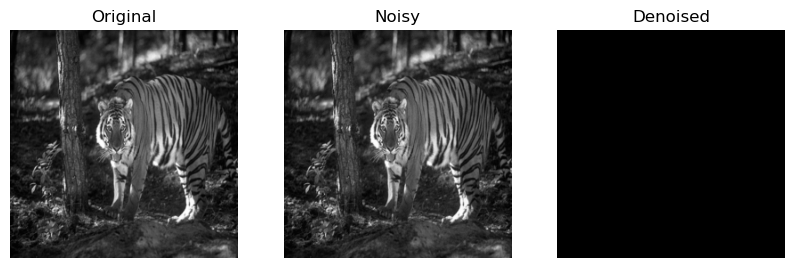

In [11]:
model.eval()
batch_count = 0

with torch.no_grad():  # Disable gradient computation
    for images in test_load:
        clean_images = images.to(device)  # original
        model_input = clean_images + (torch.randn_like(clean_images) * variance + mean)  # noisy image
        outputs = model(model_input)  # denoised image
        test_loss = loss_fn(outputs, clean_images)
        batch_count += 1

        original = images.cpu().numpy()
        noisy = model_input.cpu().numpy()
        denoised = outputs.cpu().numpy()

        print(f"Batch {batch_count}, Test Loss: {test_loss.item()}")

        # Display each of the images
        for i in range(len(original)):
            fig, axes = plt.subplots(1, 3, figsize=(10, 5))
            axes[0].imshow(original[i].squeeze(), cmap='gray')
            axes[0].set_title('Original')
            axes[0].axis('off')

            axes[1].imshow(noisy[i].squeeze(), cmap='gray')
            axes[1].set_title('Noisy')
            axes[1].axis('off')

            axes[2].imshow(denoised[i].squeeze(), cmap='gray')
            axes[2].set_title('Denoised')
            axes[2].axis('off')

            plt.show()